# Sample Integration and Comparative Analysis

This notebook demonstrates a comprehensive workflow for integrating and comparing spatial transcriptomics samples:
- Creating a mock **cancerous (mutated)** sample from healthy tissue
- Sample integration using Harmony
- **Cell type annotation with CellTypist**
- Per-cell-type differential expression analysis (DEGs)
- Per-cell-type gene set enrichment analysis (GSEA) with KEGG pathways
- Cell type proportion comparison between conditions
- Healthy vs Cancerous spatial visualization

**Author:** Generated for ST Course  
**Input Data:** adult_mouse_brain_ST4k.h5ad

## Workflow Overview:
1. Load Original Sample and Create Mock Cancerous Sample
2. Quality Control and Preprocessing
3. Sample Integration with Harmony
4. Cell Type Annotation with CellTypist
5. Differential Expression Analysis per Cell Type
6. Gene Set Enrichment Analysis (GSEA) per Cell Type
7. Cell Type Proportion Comparison
8. Spatial Visualization of Treatment Effects
9. Summary and Export

## 1. Setup and Configuration

In [1]:
# Install required packages
!pip install -q scanpy harmonypy gseapy celltypist leidenalg python-igraph scipy scikit-learn adjustText


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


In [1]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import warnings
from scipy import stats
from scipy.sparse import issparse, csr_matrix
from matplotlib.patches import Patch

# Single-cell and spatial analysis
import scanpy as sc
import anndata as ad

# Batch correction
import harmonypy as hm

# Cell type annotation
import celltypist
from celltypist import models

# Gene set enrichment
import gseapy as gp

# Configure settings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)
sc.logging.print_header()

# Reproducibility
np.random.seed(42)

print(f"\nPackage versions:")
print(f"  Scanpy: {sc.__version__}")
print(f"  AnnData: {ad.__version__}")
print(f"  CellTypist: {celltypist.__version__}")
print(f"  GSEApy: {gp.__version__}")
print(f"  Harmonypy: {hm.__version__}")

scanpy==1.10.3 anndata==0.10.8 umap==0.5.11 numpy==1.26.4 scipy==1.13.1 pandas==2.2.3 scikit-learn==1.6.1 statsmodels==0.13.2 igraph==1.0.0 louvain==0.7.1 leidenalg==0.11.0 pynndescent==0.6.0

Package versions:
  Scanpy: 1.10.3
  AnnData: 0.10.8
  CellTypist: 1.7.1
  GSEApy: 1.1.10
  Harmonypy: 0.0.10


In [2]:
# Consistent color scheme for all plots
COLORS = {
    'control': '#3A86FF',      # Blue for healthy/control
    'treated': '#FF006E',      # Pink for cancerous/mutated
    'upregulated': '#E63946',  # Red for upregulated genes
    'downregulated': '#457B9D',# Blue for downregulated genes
    'neutral': '#B1B1B1',      # Gray for non-significant
    'dark_gray': '#4A4A4A'
}

# Check if Arial is available, fall back to system default otherwise
available_fonts = [f.name for f in matplotlib.font_manager.fontManager.ttflist]
font_family = 'Arial' if 'Arial' in available_fonts else matplotlib.rcParams['font.family']
print(f"Using font: {font_family}")

# Clean publication-ready plot style
plt.rcParams.update({
    'figure.figsize': (10, 8),
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': False,
    'font.family': font_family,
    'font.size': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.frameon': False
})

Using font: Arial


## 2. Load Original Sample and Create Mock Cancerous Sample

We load the original healthy brain sample and create a mock **cancerous (mutated)** sample simulating:
- **Large-scale transcriptional changes** (25% of genes affected with strong fold changes)
- **Shifted spatial coordinates** (neighboring tissue slice)
- **Heavy batch effects** (sequencing depth, gene-specific technical variation)
- **Altered cell composition** (cancer causes differential cell survival/proliferation)

In [3]:
import os

# Resolve data path — file lives in notebooks/ whether run from project root or from inside notebooks/
_candidate_paths = [
    'adult_mouse_brain_ST4k.h5ad',
    'notebooks/adult_mouse_brain_ST4k.h5ad',
]
data_path = next((p for p in _candidate_paths if os.path.exists(p)), None)

if data_path is None:
    # File not found locally — download from Google Drive
    import gdown
    data_path = 'adult_mouse_brain_ST4k.h5ad'
    url = "https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz"
    gdown.download(url, data_path, quiet=False)
else:
    print(f"Data file found at: {data_path}")

Data file found at: adult_mouse_brain_ST4k.h5ad


In [4]:
# Load the original healthy brain sample
data_path = 'adult_mouse_brain_ST4k.h5ad'
adata_control = sc.read_h5ad(data_path)

print("ORIGINAL (HEALTHY) DATA LOADED")
print(f"  Spots: {adata_control.n_obs:,}")
print(f"  Genes: {adata_control.n_vars:,}")

# Label as healthy control
adata_control.obs['condition'] = 'Control'
adata_control.obs['batch'] = 'batch1'
adata_control.obs['sample'] = 'control'

ORIGINAL (HEALTHY) DATA LOADED
  Spots: 4,000
  Genes: 20,062


In [5]:
# ============================================================
# Create mock CANCEROUS sample with strong mutations
# ============================================================
print("CREATING MOCK CANCEROUS SAMPLE")

adata_treated = adata_control.copy()

# --- 1. Shift spatial coordinates (neighboring tissue slice) ---
coords = adata_treated.obsm['spatial'].copy()
coords[:, 0] += 80   # larger shift than typical replicate
coords[:, 1] += 50
coords[:, :2] += np.random.normal(0, 5, coords[:, :2].shape)  # more jitter
adata_treated.obsm['spatial'] = coords
print("  1. Spatial coordinates shifted")

# --- 2. Strong cancer-like gene expression changes (25% of genes) ---
n_genes = adata_treated.n_vars
n_affected = int(n_genes * 0.25)  # 25% of genes affected (cancer is aggressive)
affected_genes_idx = np.random.choice(n_genes, n_affected, replace=False)
n_up = n_affected // 2
upregulated_idx = affected_genes_idx[:n_up]
downregulated_idx = affected_genes_idx[n_up:]

# Get dense matrix for manipulation
if issparse(adata_treated.X):
    X_cancer = adata_treated.X.toarray()
else:
    X_cancer = adata_treated.X.copy()

# Apply STRONG fold changes (cancer-level dysregulation)
for idx in upregulated_idx:
    X_cancer[:, idx] *= np.random.uniform(3.0, 10.0)   # 3-10x upregulation
for idx in downregulated_idx:
    X_cancer[:, idx] *= np.random.uniform(0.02, 0.2)   # 5-50x downregulation

print(f"  2. Mutated {n_affected} genes ({len(upregulated_idx)} up, {len(downregulated_idx)} down)")

# --- 3. Heavy batch effects (different sequencing run) ---
depth_factor = np.random.uniform(0.6, 0.8)  # strong depth difference
X_cancer *= depth_factor

# Gene-specific batch effects on 50% of genes
n_batch_genes = int(n_genes * 0.50)
batch_genes_idx = np.random.choice(n_genes, n_batch_genes, replace=False)
for idx in batch_genes_idx:
    X_cancer[:, idx] *= np.random.uniform(0.5, 1.5)

# Spot-level noise
noise = np.random.normal(1.0, 0.1, X_cancer.shape)
X_cancer *= noise
X_cancer = np.maximum(X_cancer, 0)  # no negative counts

print(f"  3. Batch effects: depth={depth_factor:.2f}, {n_batch_genes} genes with technical bias")

# --- 4. Alter cell composition (cancer kills some spots, expands others) ---
# Remove 15% of spots randomly (cell death in cancer)
n_remove = int(adata_treated.n_obs * 0.15)
keep_mask = np.ones(adata_treated.n_obs, dtype=bool)
remove_idx = np.random.choice(adata_treated.n_obs, n_remove, replace=False)
keep_mask[remove_idx] = False

X_cancer = X_cancer[keep_mask]
adata_treated = adata_treated[keep_mask].copy()
adata_treated.X = csr_matrix(X_cancer)

print(f"  4. Removed {n_remove} spots (simulating cancer cell death), {adata_treated.n_obs} remain")

# Store ground truth info
adata_treated.var['is_affected'] = False
adata_treated.var.iloc[affected_genes_idx, adata_treated.var.columns.get_loc('is_affected')] = True
adata_treated.var['true_effect'] = 'none'
adata_treated.var.iloc[upregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'up'
adata_treated.var.iloc[downregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'down'

# Label as cancerous
adata_treated.obs['condition'] = 'Treated'
adata_treated.obs['batch'] = 'batch2'
adata_treated.obs['sample'] = 'treated'
adata_treated.obs_names = [name + '_cancer' for name in adata_treated.obs_names]

print(f"\nCancerous sample: {adata_treated.n_obs:,} spots, {adata_treated.n_vars:,} genes")

CREATING MOCK CANCEROUS SAMPLE
  1. Spatial coordinates shifted
  2. Mutated 5015 genes (2507 up, 2508 down)
  3. Batch effects: depth=0.68, 10031 genes with technical bias
  4. Removed 600 spots (simulating cancer cell death), 3400 remain

Cancerous sample: 3,400 spots, 20,062 genes


In [7]:
# Save the cancerous sample to disk
treated_path = 'adult_mouse_brain_ST4k_treated.h5ad'
adata_treated.write(treated_path)
print(f"Cancerous sample saved: {treated_path} ({os.path.getsize(treated_path) / (1024**2):.1f} MB)")

... storing 'condition' as categorical
... storing 'batch' as categorical
... storing 'sample' as categorical
... storing 'true_effect' as categorical


Cancerous sample saved: adult_mouse_brain_ST4k_treated.h5ad (13.4 MB)


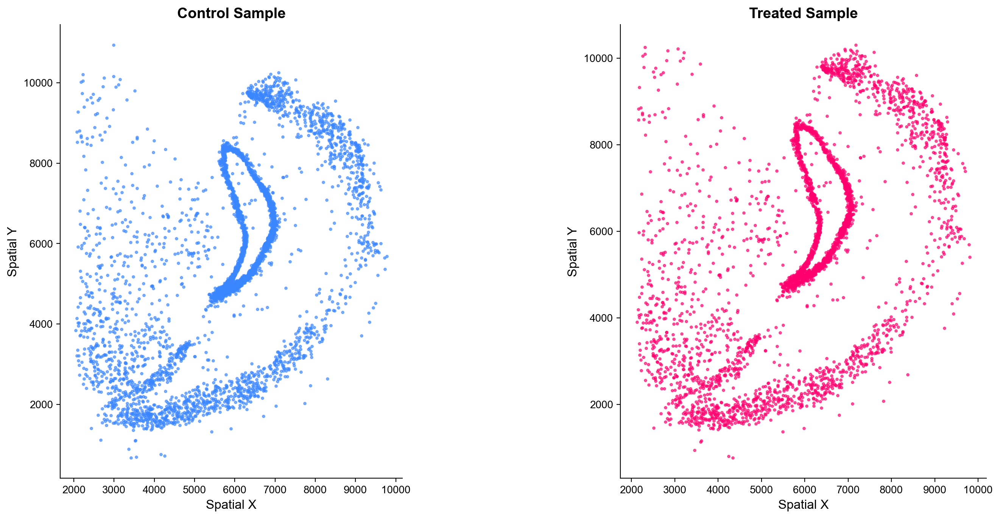

In [8]:
# Visualize both samples spatially
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for ax, adata, label, color in [
    (axes[0], adata_control, 'Control', COLORS['control']),
    (axes[1], adata_treated, 'Treated', COLORS['treated'])
]:
    coords = adata.obsm['spatial']
    ax.scatter(coords[:, 0], coords[:, 1], c=color, s=5, alpha=0.6)
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(f'{label} Sample', fontweight='bold')
    ax.set_aspect('equal')

plt.tight_layout()
plt.show()

## 3. Quality Control, Preprocessing, and Integration

In [10]:
# Merge both samples into a single AnnData object
adata_combined = ad.concat([adata_control, adata_treated],
                           join='outer',
                           label='sample_id',
                           keys=['control', 'treated'])

# Propagate condition and batch labels from the 'sample' column
adata_combined.obs['condition'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'Control', 'treated': 'Treated'})
adata_combined.obs['batch'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'batch1', 'treated': 'batch2'})

print(f"Combined dataset: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(adata_combined.obs['condition'].value_counts())

Combined dataset: 7,400 spots, 20,062 genes
condition
Control    4000
Treated    3400
Name: count, dtype: int64


In [ ]:
# --- Standard single-cell preprocessing pipeline ---

# Flag mitochondrial genes for QC
adata_combined.var['mt'] = adata_combined.var_names.str.startswith('mt-') | \
                           adata_combined.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata_combined, qc_vars=['mt'], percent_top=None,
                           log1p=False, inplace=True)

# Filter low-quality spots and rarely-detected genes
sc.pp.filter_cells(adata_combined, min_genes=200)
sc.pp.filter_genes(adata_combined, min_cells=3)

# Keep raw counts in a layer (needed for some DE methods)
adata_combined.layers['counts'] = adata_combined.X.copy()

# Normalize to 10,000 counts per spot, then log-transform
sc.pp.normalize_total(adata_combined, target_sum=1e4)
sc.pp.log1p(adata_combined)

# Store the full normalized matrix as .raw (used for DE later)
adata_combined.raw = adata_combined.copy()

# Select highly variable genes, accounting for batch
sc.pp.highly_variable_genes(adata_combined, n_top_genes=2000,
                            flavor='seurat', batch_key='batch')

print(f"After QC: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(f"HVGs selected: {adata_combined.var['highly_variable'].sum():,}")

... storing 'condition' as categorical
... storing 'batch' as categorical
... storing 'sample' as categorical


In [11]:
# Dimensionality reduction on HVGs (before batch correction)
sc.tl.pca(adata_combined, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata_combined, min_dist=0.3)
print("PCA + UMAP computed (before Harmony integration)")

PCA + UMAP computed (before Harmony integration)


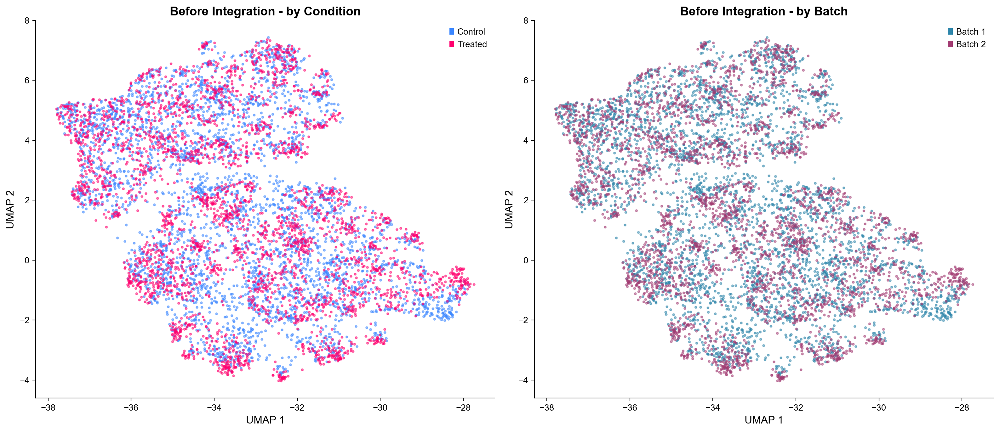

In [12]:
# Visualize before integration
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

condition_colors = {'Control': COLORS['control'], 'Treated': COLORS['treated']}
colors_cond = [condition_colors[c] for c in adata_combined.obs['condition']]

axes[0].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_cond, s=5, alpha=0.5)
axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Before Integration - by Condition', fontweight='bold')
axes[0].legend(handles=[Patch(facecolor=COLORS['control'], label='Control'),
                        Patch(facecolor=COLORS['treated'], label='Treated')])

batch_colors = {'batch1': '#2E86AB', 'batch2': '#A23B72'}
colors_batch = [batch_colors[b] for b in adata_combined.obs['batch']]

axes[1].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_batch, s=5, alpha=0.5)
axes[1].set_xlabel('UMAP 1')
axes[1].set_ylabel('UMAP 2')
axes[1].set_title('Before Integration - by Batch', fontweight='bold')
axes[1].legend(handles=[Patch(facecolor='#2E86AB', label='Batch 1'),
                        Patch(facecolor='#A23B72', label='Batch 2')])

plt.tight_layout()
plt.show()

### Harmony Integration

Harmony removes batch effects in PCA space while preserving biological variation.

In [13]:
# Run Harmony batch correction on PCA coordinates
pca_coords = adata_combined.obsm['X_pca'].copy()
meta_data = adata_combined.obs[['batch']].copy()

harmony_out = hm.run_harmony(pca_coords, meta_data, 'batch',
                              max_iter_harmony=20, verbose=True)

# harmonypy v0.2+ returns PyTorch tensors - convert to numpy
Z = harmony_out.Z_corr
try:
    import torch
    if isinstance(Z, torch.Tensor):
        Z = Z.detach().cpu().numpy()
except ImportError:
    Z = np.asarray(Z)

# Ensure shape is (n_cells, n_pcs) regardless of library version
Z = np.asarray(Z)
n_cells = adata_combined.n_obs
X_harmony = Z.T if Z.shape[0] != n_cells else Z

adata_combined.obsm['X_pca_harmony'] = X_harmony
print(f"Harmony corrected PCs: {X_harmony.shape}")

2026-03-12 11:45:17,409 - harmonypy - INFO - Running Harmony (PyTorch on mps)
Running Harmony (PyTorch on mps)
2026-03-12 11:45:17,410 - harmonypy - INFO -   Parameters:
  Parameters:
2026-03-12 11:45:17,410 - harmonypy - INFO -     max_iter_harmony: 20
    max_iter_harmony: 20
2026-03-12 11:45:17,411 - harmonypy - INFO -     max_iter_kmeans: 20
    max_iter_kmeans: 20
2026-03-12 11:45:17,411 - harmonypy - INFO -     epsilon_cluster: 1e-05
    epsilon_cluster: 1e-05
2026-03-12 11:45:17,411 - harmonypy - INFO -     epsilon_harmony: 0.0001
    epsilon_harmony: 0.0001
2026-03-12 11:45:17,412 - harmonypy - INFO -     nclust: 100
    nclust: 100
2026-03-12 11:45:17,412 - harmonypy - INFO -     block_size: 0.05
    block_size: 0.05
2026-03-12 11:45:17,413 - harmonypy - INFO -     lamb: [1. 1.]
    lamb: [1. 1.]
2026-03-12 11:45:17,413 - harmonypy - INFO -     theta: [2. 2.]
    theta: [2. 2.]
2026-03-12 11:45:17,413 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
    sigma: [0.1 0.1

Harmony corrected PCs: (7144, 50)


In [14]:
# Rebuild neighborhood graph and UMAP using Harmony-corrected PCs
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
sc.tl.umap(adata_combined, min_dist=0.3)

# Save the post-integration UMAP separately for comparison plots
adata_combined.obsm['X_umap_harmony'] = adata_combined.obsm['X_umap'].copy()
print("Post-integration UMAP computed")

Post-integration UMAP computed


In [15]:
# Cluster spots on the integrated embedding
sc.tl.leiden(adata_combined, resolution=0.5, key_added='leiden_harmony')

print(f"Found {adata_combined.obs['leiden_harmony'].nunique()} clusters:")
print(adata_combined.obs['leiden_harmony'].value_counts().sort_index())

Found 10 clusters:
leiden_harmony
0    1459
1    1077
2    1028
3     787
4     678
5     601
6     407
7     402
8     372
9     333
Name: count, dtype: int64


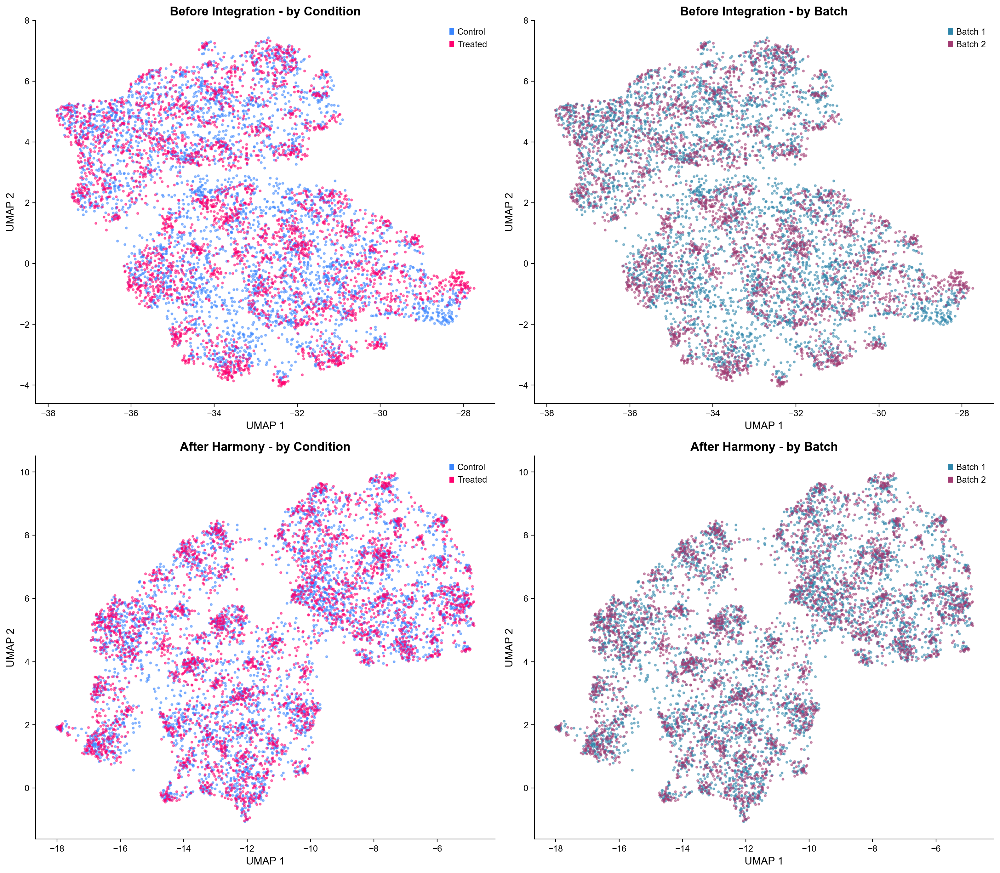

In [16]:
# Before/After integration comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

condition_colors_arr = [condition_colors[c] for c in adata_combined.obs['condition']]
batch_colors_arr = [batch_colors[b] for b in adata_combined.obs['batch']]

# Before integration
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca')
sc.tl.umap(adata_combined, min_dist=0.3)
umap_before = adata_combined.obsm['X_umap'].copy()

for ax, colors, title, legend in [
    (axes[0, 0], condition_colors_arr, 'Before Integration - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[0, 1], batch_colors_arr, 'Before Integration - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_before[:, 0], umap_before[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

# After integration
umap_after = adata_combined.obsm['X_umap_harmony']

for ax, colors, title, legend in [
    (axes[1, 0], condition_colors_arr, 'After Harmony - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[1, 1], batch_colors_arr, 'After Harmony - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_after[:, 0], umap_after[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

plt.tight_layout()
plt.show()

## 4. Cell Type Annotation with CellTypist

We use CellTypist with the `Mouse_Whole_Brain.pkl` model (334 cell types from the Allen Brain Atlas) to annotate cell types in the integrated dataset. Majority voting refines predictions using local neighborhood information.

In [17]:
# --- CellTypist annotation ---
# Ensure we use the Harmony-corrected neighbors for majority voting
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
adata_combined.obsm['X_umap'] = adata_combined.obsm['X_umap_harmony'].copy()

# Download the Mouse Whole Brain model (334 cell types, Allen Brain Atlas)
models.download_models(model='Mouse_Whole_Brain.pkl', force_update=False)

# Annotate: majority_voting smooths predictions using local neighborhoods
predictions = celltypist.annotate(
    adata_combined,
    model='Mouse_Whole_Brain.pkl',
    majority_voting=True
)
adata_combined = predictions.to_adata()

print(f"Annotated {adata_combined.obs['majority_voting'].nunique()} distinct cell types:")
print(adata_combined.obs['majority_voting'].value_counts().head(15))

📂 Storing models in /Users/vladimirk/.celltypist/data/models
💾 Total models to download: 1
⏩ Skipping [1/1]: Mouse_Whole_Brain.pkl (file exists)
🔬 Input data has 7144 cells and 15413 genes
🔗 Matching reference genes in the model
🧬 4372 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


Annotated 4 distinct cell types:
majority_voting
319 Astro-TE NN    3471
332 SMC NN         2917
318 Astro-NT NN     566
037 DG Glut         190
Name: count, dtype: int64


In [18]:
# Simplify labels: keep only the most abundant cell types, group the rest
top_n = 12
ct_counts = adata_combined.obs['majority_voting'].value_counts()
top_types = ct_counts.head(top_n).index.tolist()

adata_combined.obs['cell_type'] = adata_combined.obs['majority_voting'].apply(
    lambda x: x if x in top_types else 'Other'
)

print(f"Top {top_n} cell types + 'Other' = {adata_combined.obs['cell_type'].nunique()} categories:")
print(adata_combined.obs['cell_type'].value_counts())

Top 12 cell types + 'Other' = 4 categories:
cell_type
319 Astro-TE NN    3471
332 SMC NN         2917
318 Astro-NT NN     566
037 DG Glut         190
Name: count, dtype: int64


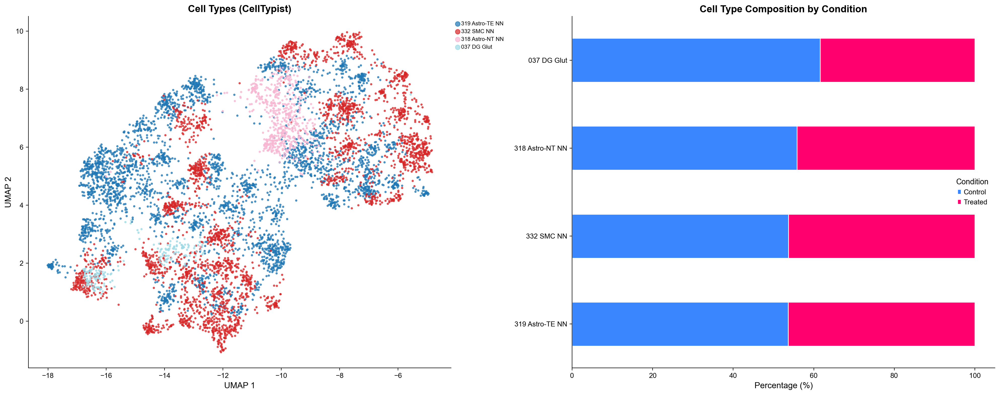

In [19]:
# UMAP colored by cell type
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Cell type UMAP
cell_types_unique = adata_combined.obs['cell_type'].value_counts().index.tolist()
n_types = len(cell_types_unique)
cmap = plt.cm.tab20(np.linspace(0, 1, max(n_types, 2)))
ct_color_map = {ct: cmap[i] for i, ct in enumerate(cell_types_unique)}

umap = adata_combined.obsm['X_umap_harmony']
for ct in cell_types_unique:
    mask = adata_combined.obs['cell_type'] == ct
    axes[0].scatter(umap[mask, 0], umap[mask, 1],
                   c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Cell Types (CellTypist)', fontweight='bold')
axes[0].legend(markerscale=3, fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))

# Cell type by condition
ct_cond = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'],
                       normalize='index') * 100
ct_cond = ct_cond.loc[cell_types_unique]

ct_cond[['Control', 'Treated']].plot(
    kind='barh', stacked=True, ax=axes[1],
    color=[COLORS['control'], COLORS['treated']], edgecolor='white', linewidth=1)
axes[1].set_xlabel('Percentage (%)')
axes[1].set_ylabel('')
axes[1].set_title('Cell Type Composition by Condition', fontweight='bold')
axes[1].legend(title='Condition')

plt.tight_layout()
plt.show()

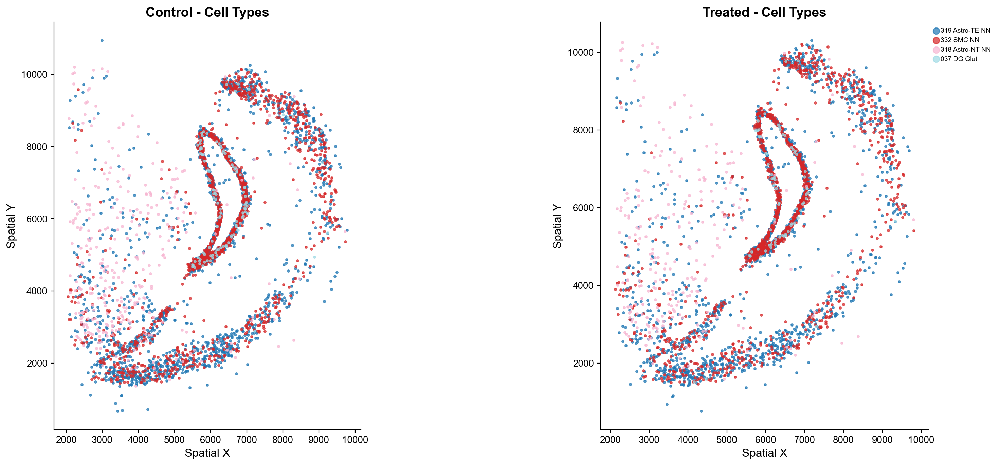

In [20]:
# Spatial visualization of cell types
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, cond, title in [(axes[0], 'Control', 'Control - Cell Types'),
                         (axes[1], 'Treated', 'Treated - Cell Types')]:
    mask = adata_combined.obs['condition'] == cond
    coords = adata_combined.obsm['spatial'][mask]
    ct_vals = adata_combined.obs.loc[mask, 'cell_type']

    for ct in cell_types_unique:
        ct_mask = ct_vals == ct
        if ct_mask.sum() > 0:
            ax.scatter(coords[ct_mask, 0], coords[ct_mask, 1],
                      c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(title, fontweight='bold')
    ax.set_aspect('equal')

axes[1].legend(markerscale=3, fontsize=7, loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

## 5. Differential Expression Analysis per Cell Type

We perform Treated vs Control DE analysis within each cell type using Wilcoxon rank-sum test. The Control sample is used as reference.

In [21]:
# --- Differential expression: Cancerous vs Control within each cell type ---
pval_threshold = 0.05
logfc_threshold = 0.5
min_cells = 30  # skip cell types with fewer cells per condition

all_deg_results = {}
deg_summary = []

# Only test cell types with enough cells (skip 'Other')
cell_types_unique = adata_combined.obs['cell_type'].value_counts().index.tolist()
analysis_types = [ct for ct in cell_types_unique if ct != 'Other']

for ct in analysis_types:
    # Subset to this cell type
    mask = adata_combined.obs['cell_type'] == ct
    adata_sub = adata_combined[mask].copy()

    # Need enough cells in BOTH conditions
    counts_per_cond = adata_sub.obs['condition'].value_counts()
    if counts_per_cond.min() < min_cells:
        print(f"  Skipping {ct}: too few cells ({counts_per_cond.min()} < {min_cells})")
        continue

    # Wilcoxon rank-sum test (Treated vs Control)
    sc.tl.rank_genes_groups(
        adata_sub,
        groupby='condition',
        groups=['Treated'],
        reference='Control',
        method='wilcoxon',
        use_raw=True,
        key_added='de_condition'
    )

    # Extract results into a DataFrame
    df = sc.get.rank_genes_groups_df(adata_sub, group='Treated', key='de_condition')
    df['cell_type'] = ct
    df['-log10_pval'] = -np.log10(df['pvals_adj'] + 1e-300)

    # Classify regulation
    df['regulation'] = 'Not significant'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] > logfc_threshold), 'regulation'] = 'Upregulated'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] < -logfc_threshold), 'regulation'] = 'Downregulated'

    n_up = (df['regulation'] == 'Upregulated').sum()
    n_down = (df['regulation'] == 'Downregulated').sum()

    all_deg_results[ct] = df
    deg_summary.append({'cell_type': ct, 'n_up': n_up, 'n_down': n_down,
                        'n_total_deg': n_up + n_down, 'n_cells': adata_sub.n_obs})

    print(f"  {ct}: {n_up} up, {n_down} down ({adata_sub.n_obs} cells)")

deg_summary_df = pd.DataFrame(deg_summary).sort_values('n_total_deg', ascending=False)
print(f"\nDE complete for {len(all_deg_results)} cell types, "
      f"total DEGs: {deg_summary_df['n_total_deg'].sum()}")

  319 Astro-TE NN: 24 up, 66 down (3471 cells)
  332 SMC NN: 17 up, 47 down (2917 cells)
  318 Astro-NT NN: 5 up, 13 down (566 cells)
  037 DG Glut: 1 up, 6 down (190 cells)

DE complete for 4 cell types, total DEGs: 179


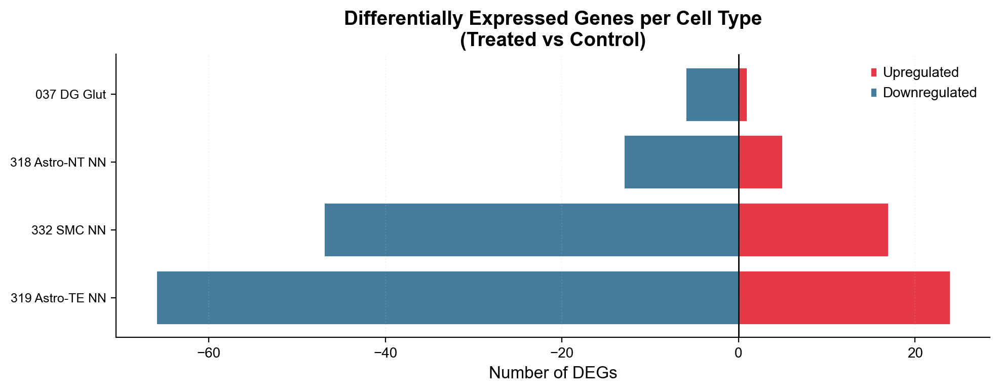

In [22]:
# DEG summary heatmap
fig, ax = plt.subplots(figsize=(10, max(4, len(deg_summary_df) * 0.5)))

summary_plot = deg_summary_df.set_index('cell_type')[['n_up', 'n_down']].copy()
summary_plot.columns = ['Upregulated', 'Downregulated']
summary_plot['Downregulated'] = -summary_plot['Downregulated']  # negative for visualization

y_pos = range(len(summary_plot))
ax.barh(y_pos, summary_plot['Upregulated'], color=COLORS['upregulated'],
        edgecolor='white', linewidth=1, label='Upregulated')
ax.barh(y_pos, summary_plot['Downregulated'], color=COLORS['downregulated'],
        edgecolor='white', linewidth=1, label='Downregulated')

ax.set_yticks(y_pos)
ax.set_yticklabels(summary_plot.index, fontsize=9)
ax.set_xlabel('Number of DEGs')
ax.set_title('Differentially Expressed Genes per Cell Type\n(Treated vs Control)', fontweight='bold')
ax.axvline(x=0, color='black', linewidth=1)
ax.legend()
ax.grid(True, alpha=0.2, axis='x', linestyle=':')

plt.tight_layout()
plt.show()

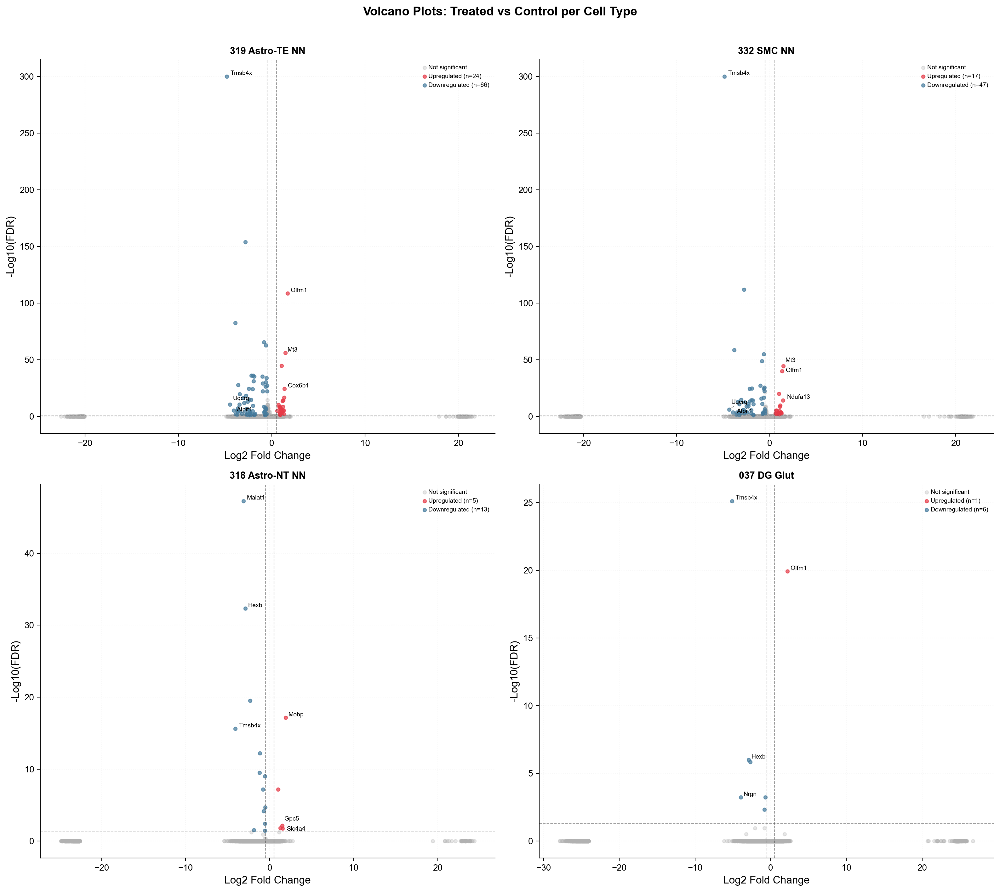

In [23]:
# Volcano plots for top cell types (by total DEGs)
from adjustText import adjust_text

top_ct_for_volcano = deg_summary_df.head(4)['cell_type'].tolist()
n_panels = len(top_ct_for_volcano)

if n_panels > 0:
    ncols = min(n_panels, 2)
    nrows = (n_panels + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
    if n_panels == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes)

    for i, ct in enumerate(top_ct_for_volcano):
        r, c = divmod(i, ncols)
        ax = axes[r, c]
        df = all_deg_results[ct]

        for reg, color, alpha in [
            ('Not significant', COLORS['neutral'], 0.3),
            ('Upregulated', COLORS['upregulated'], 0.7),
            ('Downregulated', COLORS['downregulated'], 0.7)
        ]:
            sub = df[df['regulation'] == reg]
            n = len(sub)
            label = f'{reg} (n={n})' if reg != 'Not significant' else reg
            ax.scatter(sub['logfoldchanges'], sub['-log10_pval'],
                      c=color, s=15, alpha=alpha, label=label)

        ax.axhline(y=-np.log10(pval_threshold), color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=-logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)

        # Label top genes
        top_genes = pd.concat([
            df[df['regulation'] == 'Upregulated'].nlargest(3, 'logfoldchanges'),
            df[df['regulation'] == 'Downregulated'].nsmallest(3, 'logfoldchanges')
        ])
        if len(top_genes) > 0:
            texts = [ax.text(row['logfoldchanges'], row['-log10_pval'],
                           row['names'], fontsize=7)
                    for _, row in top_genes.iterrows()]
            adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

        ax.set_xlabel('Log2 Fold Change')
        ax.set_ylabel('-Log10(FDR)')
        ax.set_title(ct, fontweight='bold', fontsize=11)
        ax.legend(fontsize=7, loc='upper right')
        ax.grid(True, alpha=0.15, linestyle=':')

    # Hide unused axes
    for i in range(n_panels, nrows * ncols):
        r, c = divmod(i, ncols)
        axes[r, c].set_visible(False)

    fig.suptitle('Volcano Plots: Treated vs Control per Cell Type', fontweight='bold', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

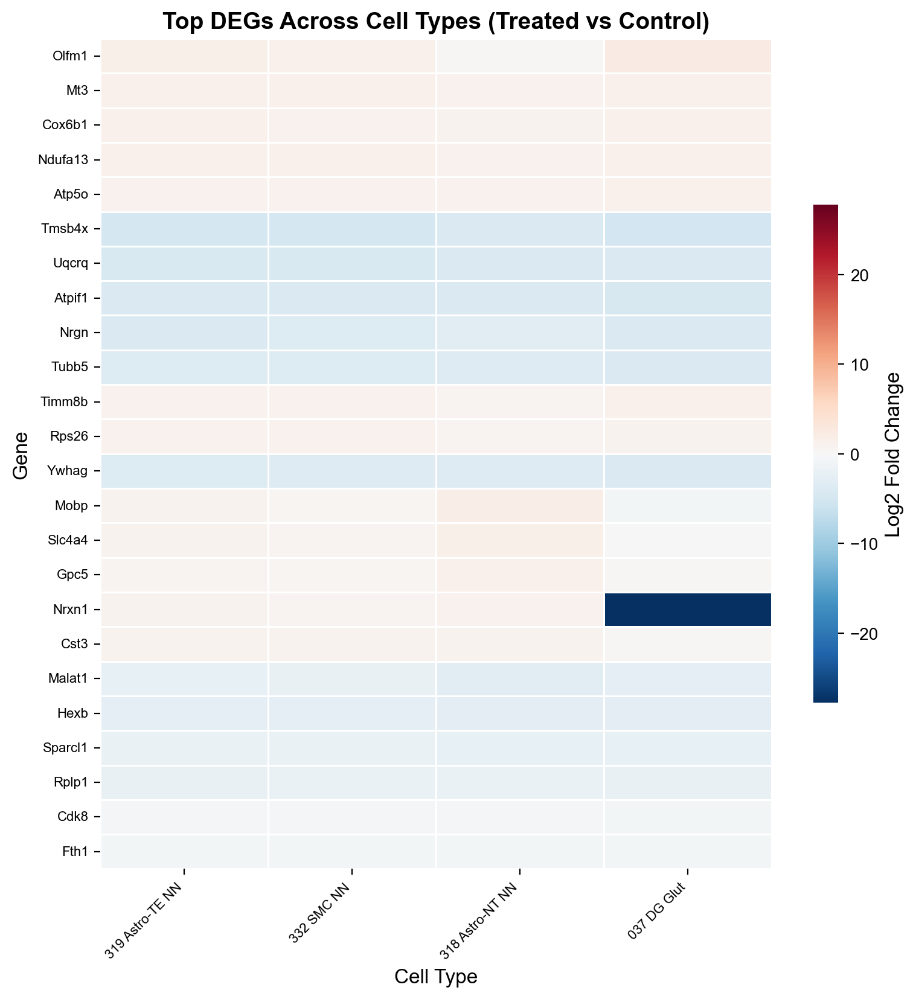

In [24]:
# Cross-cell-type DEG heatmap: top shared DEGs
# Collect top DEGs across cell types
top_genes_per_ct = []
for ct, df in all_deg_results.items():
    sig = df[df['regulation'] != 'Not significant']
    top = sig.nlargest(5, 'logfoldchanges')['names'].tolist() + \
          sig.nsmallest(5, 'logfoldchanges')['names'].tolist()
    top_genes_per_ct.extend(top)

# Get unique top genes
unique_top_genes = list(dict.fromkeys(top_genes_per_ct))[:30]

if len(unique_top_genes) > 0 and len(all_deg_results) > 1:
    # Build logFC matrix
    logfc_matrix = pd.DataFrame(index=unique_top_genes)
    for ct, df in all_deg_results.items():
        df_idx = df.set_index('names')
        logfc_matrix[ct] = df_idx.reindex(unique_top_genes)['logfoldchanges']

    logfc_matrix = logfc_matrix.dropna(how='all')
    logfc_matrix = logfc_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_deg_results) * 1.2),
                                     max(6, len(logfc_matrix) * 0.35)))

    vmax = np.abs(logfc_matrix.values).max()
    sns.heatmap(logfc_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Log2 Fold Change', 'shrink': 0.6})

    ax.set_title('Top DEGs Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('Gene')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

## 6. Gene Set Enrichment Analysis (GSEA) per Cell Type

GSEA with KEGG pathways identifies biological processes affected by treatment within each cell type.

In [25]:
# GSEA per cell type using KEGG pathways
# Try multiple KEGG library names (availability varies by gseapy version)
kegg_libs = ['KEGG_2019_Mouse', 'KEGG_2021_Mouse', 'KEGG_2016']
kegg_lib = None

# Find which KEGG library is available
for lib in kegg_libs:
    try:
        test_genes = all_deg_results[list(all_deg_results.keys())[0]]
        test_rnk = test_genes.set_index('names')['logfoldchanges'].sort_values(ascending=False)
        test_rnk = test_rnk[~test_rnk.index.duplicated(keep='first')]
        _ = gp.prerank(rnk=test_rnk.head(100), gene_sets=lib,
                       processes=1, permutation_num=10, outdir=None, verbose=False)
        kegg_lib = lib
        print(f"Using gene set library: {kegg_lib}")
        break
    except Exception:
        continue

if kegg_lib is None:
    # Download KEGG mouse pathways directly from Enrichr as fallback
    print("No pre-built KEGG library found, downloading from Enrichr...")
    try:
        kegg_lib = gp.get_library_name(organism='Mouse')
        kegg_lib = [x for x in kegg_lib if 'KEGG' in x][0]
        print(f"Found: {kegg_lib}")
    except Exception:
        print("Could not find any KEGG library. GSEA will be skipped.")

# Run GSEA for each cell type
all_gsea_results = {}

if kegg_lib:
    for ct, df in all_deg_results.items():
        # Rank genes by log fold change
        gene_list = df.set_index('names')['logfoldchanges'].sort_values(ascending=False)
        gene_list = gene_list[~gene_list.index.duplicated(keep='first')]

        try:
            gsea_res = gp.prerank(
                rnk=gene_list,
                gene_sets=kegg_lib,
                processes=1,
                permutation_num=100,
                outdir=None,
                format='png',
                seed=42,
                verbose=False
            )

            gsea_df = gsea_res.res2d.copy()
            gsea_df['cell_type'] = ct
            all_gsea_results[ct] = gsea_df

            n_sig = (gsea_df['FDR q-val'] < 0.25).sum()
            print(f"  {ct}: {len(gsea_df)} pathways, {n_sig} significant (FDR < 0.25)")

        except Exception as e:
            print(f"  {ct}: GSEA failed - {e}")

print(f"\nGSEA complete for {len(all_gsea_results)} cell types")

2026-03-12 11:46:06,279 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-03-12 11:46:06,280 [ERROR] The first entry of your gene_sets (gmt) look like this : { ABC transporters: [ABCG8, ABCC4, ABCA2, ABCA3, ABCC5, ABCC2, ABCA1, ABCC3, ABCC8, ABCA8B, ABCA6, ABCC9, ABCA7, ABCA4, ABCC6, ABCA5, TAP2, TAP1, ABCA8A, ABCA9, ABCB10, ABCB11, ABCC10, ABCA12, ABCG1, ABCG4, ABCC1, ABCG5, ABCG2, CFTR, ABCG3, ABCB4, ABCD3, ABCD4, ABCB1A, ABCB7, ABCB8, ABCB5, ABCB6, ABCA17, ABCB9, ABCA13, ABCC12, ABCA14, DEFB1, ABCB1B, ABCD1, ABCD2]}
2026-03-12 11:46:06,280 [ERROR] The first 5 genes look like this : [ Cdt1, Peak1os, Nhlh2, Impg2, Olfr729 ]
2026-03-12 11:46:07,200 [ERROR] No supported gene_sets: KEGG_2021_Mouse
2026-03-12 11:46:07,268 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1:

No pre-built KEGG library found, downloading from Enrichr...


2026-03-12 11:46:08,103 [WARNING] Duplicated values found in preranked stats: 2.14% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Found: KEGG_2013


2026-03-12 11:46:08,938 [WARNING] Duplicated values found in preranked stats: 5.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  319 Astro-TE NN: 132 pathways, 0 significant (FDR < 0.25)


2026-03-12 11:46:09,761 [WARNING] Duplicated values found in preranked stats: 19.04% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  332 SMC NN: 132 pathways, 2 significant (FDR < 0.25)


2026-03-12 11:46:10,554 [WARNING] Duplicated values found in preranked stats: 39.88% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  318 Astro-NT NN: 132 pathways, 1 significant (FDR < 0.25)
  037 DG Glut: 132 pathways, 3 significant (FDR < 0.25)

GSEA complete for 4 cell types


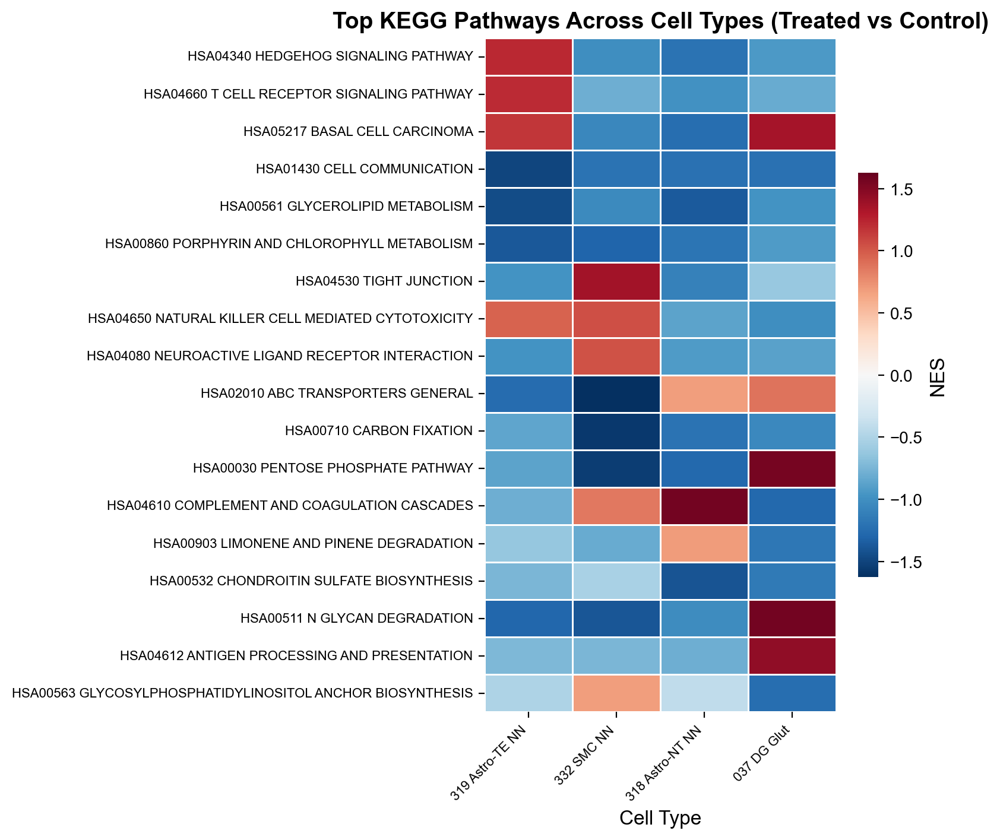

In [26]:
# GSEA visualization: top pathways across cell types
if len(all_gsea_results) > 0:
    # Ensure numeric columns (gseapy sometimes returns strings)
    for ct in all_gsea_results:
        all_gsea_results[ct]['NES'] = pd.to_numeric(all_gsea_results[ct]['NES'], errors='coerce')
        all_gsea_results[ct]['FDR q-val'] = pd.to_numeric(all_gsea_results[ct]['FDR q-val'], errors='coerce')

    # Collect top pathways per cell type
    top_pathways_list = []
    for ct, df in all_gsea_results.items():
        top_up = df.nlargest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        top_down = df.nsmallest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        combined = pd.concat([top_up, top_down])
        combined['cell_type'] = ct
        top_pathways_list.append(combined)

    top_pathways_all = pd.concat(top_pathways_list)

    # Get unique pathways
    unique_pathways = top_pathways_all['Term'].unique()[:20]

    # Build NES matrix
    nes_matrix = pd.DataFrame(index=unique_pathways)
    for ct, df in all_gsea_results.items():
        df_idx = df.set_index('Term')
        nes_matrix[ct] = df_idx.reindex(unique_pathways)['NES']

    nes_matrix = nes_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_gsea_results) * 1.5),
                                     max(6, len(nes_matrix) * 0.4)))

    vmax = np.abs(nes_matrix.values).max()
    sns.heatmap(nes_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'NES', 'shrink': 0.6})

    ax.set_title('Top KEGG Pathways Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

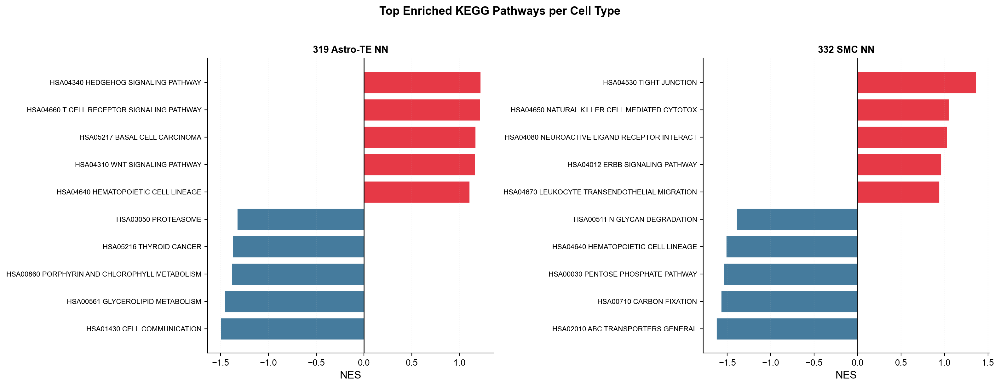

In [27]:
# Per cell type GSEA bar plots for top 2 cell types by DEGs
top_ct_for_gsea = deg_summary_df.head(2)['cell_type'].tolist()
top_ct_for_gsea = [ct for ct in top_ct_for_gsea if ct in all_gsea_results]

if len(top_ct_for_gsea) > 0:
    fig, axes = plt.subplots(1, len(top_ct_for_gsea),
                            figsize=(8 * len(top_ct_for_gsea), 6))
    if len(top_ct_for_gsea) == 1:
        axes = [axes]

    for ax, ct in zip(axes, top_ct_for_gsea):
        df = all_gsea_results[ct].copy()
        df['NES'] = pd.to_numeric(df['NES'], errors='coerce')
        df = df.dropna(subset=['NES'])
        # Top 5 up and down by NES
        top = pd.concat([df.nlargest(5, 'NES'), df.nsmallest(5, 'NES')])
        top = top.sort_values('NES')

        colors = [COLORS['upregulated'] if x > 0 else COLORS['downregulated']
                  for x in top['NES']]

        ax.barh(range(len(top)), top['NES'], color=colors,
                edgecolor='white', linewidth=1)
        ax.set_yticks(range(len(top)))
        ax.set_yticklabels([t[:45] for t in top['Term']], fontsize=8)
        ax.set_xlabel('NES')
        ax.set_title(f'{ct}', fontweight='bold', fontsize=11)
        ax.axvline(x=0, color='black', linewidth=1)
        ax.grid(True, alpha=0.15, axis='x', linestyle=':')

    fig.suptitle('Top Enriched KEGG Pathways per Cell Type', fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

## 7. Cell Type Proportion Comparison

Analyze whether treatment affects the relative abundance of different cell types.

In [28]:
# --- Cell type proportion comparison ---
from scipy.stats import chi2_contingency, fisher_exact
from statsmodels.stats.multitest import multipletests

# Count cells per type per condition
ct_counts = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'])

# Convert to percentages
ct_props = ct_counts.div(ct_counts.sum(axis=0), axis=1) * 100
ct_props['Difference'] = ct_props['Treated'] - ct_props['Control']

# Global test: are proportions different between conditions?
chi2, pval, dof, _ = chi2_contingency(ct_counts)
print(f"Chi-square test (overall): chi2={chi2:.2f}, p={pval:.2e}")

# Per-cell-type: Fisher's exact test with FDR correction
fisher_results = []
for ct in ct_counts.index:
    ct_in = ct_counts.loc[ct].values
    ct_out = ct_counts.sum(axis=0).values - ct_in
    contingency = np.array([ct_in, ct_out])
    oddsratio, pval_f = fisher_exact(contingency.T)
    fisher_results.append({
        'cell_type': ct, 'odds_ratio': oddsratio, 'p_value': pval_f,
        'control_prop': ct_props.loc[ct, 'Control'],
        'treated_prop': ct_props.loc[ct, 'Treated'],
        'difference': ct_props.loc[ct, 'Difference']
    })

fisher_df = pd.DataFrame(fisher_results)
fisher_df['p_adj'] = multipletests(fisher_df['p_value'], method='fdr_bh')[1]
fisher_df = fisher_df.sort_values('p_adj')

print(f"\nProportion changes:")
print(fisher_df[['cell_type', 'control_prop', 'treated_prop', 'difference', 'p_adj']].to_string(index=False))

Chi-square test (overall): chi2=5.41, p=1.44e-01

Proportion changes:
      cell_type  control_prop  treated_prop  difference    p_adj
    037 DG Glut      3.029518      2.224254   -0.805265 0.154671
318 Astro-NT NN      8.182289      7.617307   -0.564982 0.612052
319 Astro-TE NN     48.239254     48.994516    0.755261 0.612052
     332 SMC NN     40.548938     41.163924    0.614986 0.612052


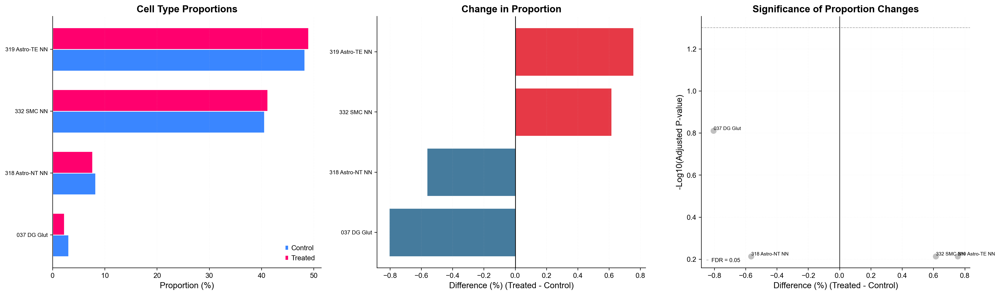

In [29]:
# Proportion comparison visualization
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 1. Side-by-side bar chart
plot_props = ct_props[['Control', 'Treated']].sort_values('Control', ascending=True)
y_pos = range(len(plot_props))
bar_height = 0.35

axes[0].barh([y - bar_height/2 for y in y_pos], plot_props['Control'],
            bar_height, color=COLORS['control'], label='Control', edgecolor='white')
axes[0].barh([y + bar_height/2 for y in y_pos], plot_props['Treated'],
            bar_height, color=COLORS['treated'], label='Treated', edgecolor='white')
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(plot_props.index, fontsize=8)
axes[0].set_xlabel('Proportion (%)')
axes[0].set_title('Cell Type Proportions', fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.15, axis='x', linestyle=':')

# 2. Difference plot
diff_sorted = ct_props['Difference'].sort_values()
colors_diff = [COLORS['upregulated'] if x > 0 else COLORS['downregulated'] for x in diff_sorted]

axes[1].barh(range(len(diff_sorted)), diff_sorted, color=colors_diff,
            edgecolor='white', linewidth=1)
axes[1].set_yticks(range(len(diff_sorted)))
axes[1].set_yticklabels(diff_sorted.index, fontsize=8)
axes[1].axvline(x=0, color='black', linewidth=1)
axes[1].set_xlabel('Difference (%) (Treated - Control)')
axes[1].set_title('Change in Proportion', fontweight='bold')
axes[1].grid(True, alpha=0.15, axis='x', linestyle=':')

# 3. Statistical significance
fisher_df['-log10_pval'] = -np.log10(fisher_df['p_adj'] + 1e-10)
colors_vol = []
for _, row in fisher_df.iterrows():
    if row['p_adj'] < 0.05:
        colors_vol.append(COLORS['upregulated'] if row['difference'] > 0 else COLORS['downregulated'])
    else:
        colors_vol.append(COLORS['neutral'])

axes[2].scatter(fisher_df['difference'], fisher_df['-log10_pval'],
              c=colors_vol, s=80, alpha=0.8, edgecolors='white', linewidths=0.5)
axes[2].axhline(y=-np.log10(0.05), color=COLORS['dark_gray'],
              linestyle='--', linewidth=0.8, alpha=0.5, label='FDR = 0.05')
axes[2].axvline(x=0, color='black', linewidth=0.8)

for _, row in fisher_df.iterrows():
    axes[2].annotate(row['cell_type'][:20], (row['difference'], row['-log10_pval']),
                    fontsize=7, ha='left', va='bottom')

axes[2].set_xlabel('Difference (%) (Treated - Control)')
axes[2].set_ylabel('-Log10(Adjusted P-value)')
axes[2].set_title('Significance of Proportion Changes', fontweight='bold')
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.15, linestyle=':')

plt.tight_layout()
plt.show()

## 8. Spatial Domain Alignment with STalign

Adjacent tissue sections (e.g. healthy slice vs treated slice) are cut, placed, and imaged independently, so their spatial coordinates live in **different physical frames of reference**. Before asking "does cell type X occupy the same region in both conditions?" we must bring both coordinate systems into alignment.

**STalign** solves this with a diffeomorphic registration framework (LDDMM):
- Converts each slice to a 2D density image (kernel density of spot positions)
- Finds a smooth, invertible spatial warp **φ** that maps source coordinates onto the target frame
- Minimises: `E(v) = ||I_S(φ) − I_T||² + λ·||Lv||²` (alignment quality + smoothness)
- Outputs new `(x', y')` coordinates stored in `adata.obsm['spatial_aligned']`

After alignment both slices share one coordinate frame.  The warp itself carries **biologically interpretable information** about structural differences between conditions:

| Derived quantity | Biological meaning |
|---|---|
| **Jacobian determinant** | Local area expansion (> 1) or compression (< 1) — tumour oedema, atrophy, dense infiltration |
| **Displacement magnitude** | How much a tissue region shifted — flags zones of maximal structural divergence |
| **Deformation grid** | Visualises non-linear tissue rearrangement — straight grid = rigid shift only |
| **Per-cell-type displacement** | Which cell populations reside in the most structurally altered regions |


In [8]:
# STalign requires --no-deps because it pins numpy==1.23.4 (incompatible with Python 3.14+)
# We install only the actual runtime dependencies that are not already present.
!pip install -q --no-deps "git+https://github.com/JEFworks-Lab/STalign.git"
!pip install -q pynrrd plotly scikit-image

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
stalign 1.0 requires autodocsumm==0.2.10, which is not installed.
stalign 1.0 requires docopt==0.6.2, which is not installed.
stalign 1.0 requires mdit-py-plugins==0.3.5, which is not installed.
stalign 1.0 requires myst-parser==1.0.0, which is not installed.
stalign 1.0 requires nbsphinx==0.9.1, which is not installed.
stalign 1.0 requires nptyping==2.5.0, which is not installed.
stalign 1.0 requires pipreqs==0.4.13, which is not installed.
stalign 1.0 requires pypandoc==1.11, which is not installed.
stalign 1.0 requires readthedocs-sphinx-search==0.3.1, which is not installed.
stalign 1.0 requires sphinx-rtd-theme==1.2.0, which is not installed.
stalign 1.0 requires sphinxcontrib-jquery==4.1, which is not installed.
stalign 1.0 requires yarg==0.1.9, which is not installed.
stalign 1.0 requires Babel==2.12.1, but

In [ ]:
%matplotlib inline
import numpy as np
import torch
import matplotlib.pyplot as plt
from STalign import STalign

# Use QC-filtered coordinates from adata_combined to stay consistent with all
# downstream annotations (cell types, condition labels, etc.).
mask_ctrl  = adata_combined.obs['condition'] == 'Control'
mask_treat = adata_combined.obs['condition'] == 'Treated'

# Control = reference frame (target); treated = slice to warp (source).
# STalign convention: pass x and y as separate 1-D arrays.
xI = adata_combined.obsm['spatial'][mask_ctrl,  0].astype(np.float64)
yI = adata_combined.obsm['spatial'][mask_ctrl,  1].astype(np.float64)
xJ = adata_combined.obsm['spatial'][mask_treat, 0].astype(np.float64)
yJ = adata_combined.obsm['spatial'][mask_treat, 1].astype(np.float64)

print(f"Control (target):  {len(xI):,} spots")
print(f"Treated (source):  {len(xJ):,} spots")

0 of 3862
3861 of 3862
0 of 3282
3281 of 3282
Source image shape: (1, 226, 170)  (channels, H, W)
Target image shape: (1, 210, 169)
Alignment complete.


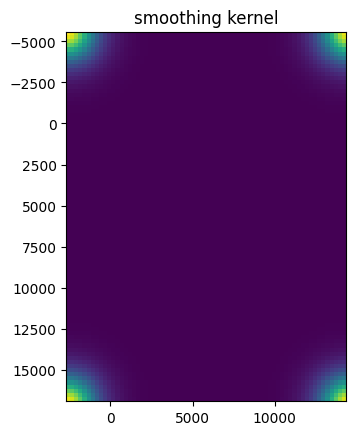

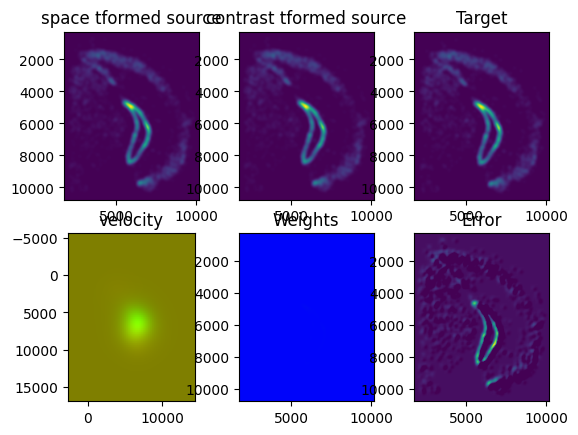

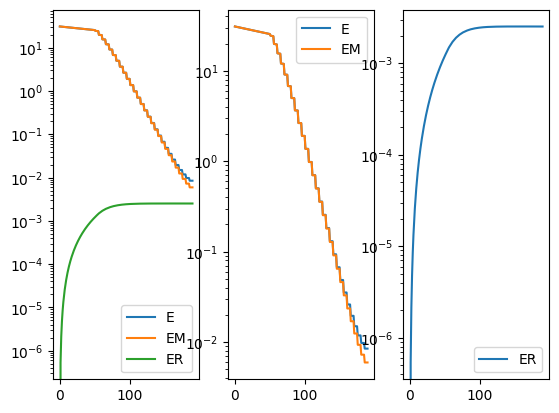

In [3]:
# ── 2. Rasterise spot clouds into density images ─────────────────────────────
# STalign converts discrete spot positions into smooth 2D images before
# running LDDMM.  dx controls pixel size (in same units as coordinates).
# NOTE: rasterize takes (x, y) but the grid it returns is (XI, YI) where
#       XI/YI are 1-D arrays used later as [YI, XI] (y-first) in LDDMM.

XI, YI, I, _ = STalign.rasterize(xI, yI, dx=50)
XJ, YJ, J, _ = STalign.rasterize(xJ, yJ, dx=50)
plt.close('all')   # rasterize creates a figure; close it to stay clean

print(f"Source image shape: {I.shape}  (channels, H, W)")
print(f"Target image shape: {J.shape}")

# ── 3. Run LDDMM alignment ───────────────────────────────────────────────────
# Key parameters:
#   epV        – gradient step size for velocity field (smaller = more cautious)
#   niter      – optimisation iterations
#   sigmaM/B/A – matching / background / artifact sigmas
# Grid args MUST be [Y, X] — STalign's internal convention.

device = 'cuda' if torch.cuda.is_available() else 'cpu'

out = STalign.LDDMM(
    [YI, XI], I,    # source: [y-grid, x-grid], density image
    [YJ, XJ], J,    # target: [y-grid, x-grid], density image
    niter=200,
    epV=100,
    sigmaM=1.5,
    sigmaB=1.0,
    sigmaA=1.1,
    device=device,
)

A  = out['A']    # affine component
v  = out['v']    # velocity field
xv = out['xv']   # velocity field grid

print("Alignment complete.")

In [4]:
# ── 4. Apply warp to spot coordinates ────────────────────────────────────────
# transform_points_source_to_target maps source (treated) spots into the
# target (control) coordinate frame.
# Input must be (N, 2) array with columns ordered as [y, x].

pts_source  = np.stack([yJ, xJ], axis=1)
pts_aligned = STalign.transform_points_source_to_target(xv, v, A, pts_source)

# STalign returns torch.Tensors on some versions — convert to numpy immediately
# so downstream cells can use standard numpy/matplotlib operations without surprises.
try:
    import torch as _torch
    if isinstance(pts_aligned, _torch.Tensor):
        pts_aligned = pts_aligned.detach().cpu().numpy()
except ImportError:
    pass
pts_aligned = np.asarray(pts_aligned, dtype=np.float64)

xJ_aligned = pts_aligned[:, 1]   # aligned x
yJ_aligned = pts_aligned[:, 0]   # aligned y

# xI/yI (control) and xJ_aligned/yJ_aligned (treated, warped) now share
# the same coordinate frame and are used directly in the plots below.
print(f"Treated spots warped: {len(xJ_aligned):,}")
print(f"Max displacement: {np.abs(pts_aligned - pts_source).max():.2f} coordinate units")

Treated spots warped: 3,282
Max displacement: 14.28 coordinate units


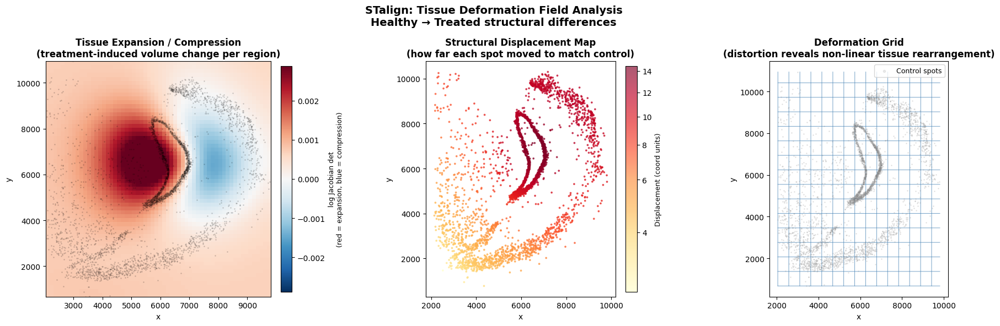

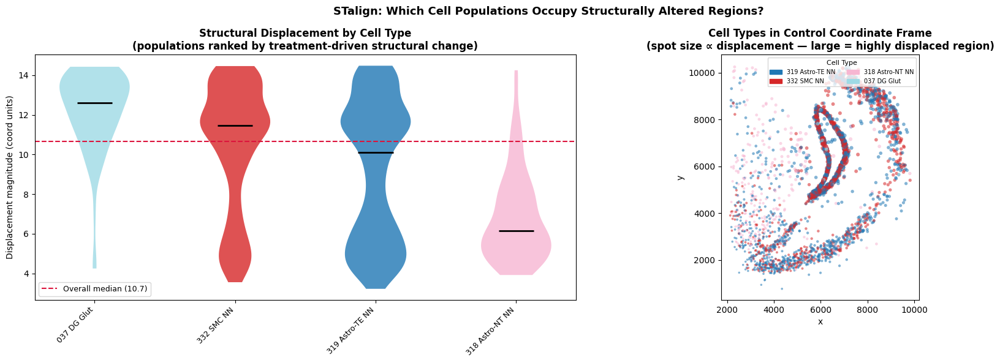

Jacobian determinant range: 0.9984–1.0040
  84.8% of tissue area locally expanded in treated sample (Jac > 1)
  15.2% of tissue area locally compressed in treated sample (Jac < 1)
Median structural displacement: 10.7 coordinate units
Most structurally displaced cell type: 037 DG Glut
Least structurally displaced cell type: 318 Astro-NT NN


In [5]:
# ── 5. Biologically-Interpretable Deformation Field Analysis ─────────────────
# The STalign warp encodes genuine biological information about how tissue
# structure differs between conditions.  We extract four complementary views:
#
#   (A) Expansion / Compression map  — Jacobian determinant of the warp field.
#       log(det J) > 0 → this tissue region is locally EXPANDED in treated
#                        (e.g. tumour oedema, necrotic swelling)
#       log(det J) < 0 → this tissue region is locally CONTRACTED in treated
#                        (e.g. dense tumour mass, tissue loss, atrophy)
#
#   (B) Structural displacement map  — How far each treated spot had to move
#       to match the control frame; high values flag regions of maximal
#       structural difference between the two conditions.
#
#   (C) Deformation grid  — A regular grid warped through the same transform.
#       Straight lines → rigid body motion only; bulges / compressions →
#       non-linear tissue rearrangement.
#
#   (D) Cell-type-resolved displacement  — Which cell populations reside in
#       the most structurally altered regions?

import matplotlib.colors as mcolors
from scipy.ndimage import gaussian_filter

# ── Build a dense grid and push it through the warp ──────────────────────────
xmin = min(xI.min(), xJ.min());  xmax = max(xI.max(), xJ.max())
ymin = min(yI.min(), yJ.min());  ymax = max(yI.max(), yJ.max())

ngrid = 60
gx = np.linspace(xmin, xmax, ngrid)
gy = np.linspace(ymin, ymax, ngrid)
GX, GY = np.meshgrid(gx, gy)                         # shape (ngrid, ngrid)

grid_pts    = np.stack([GY.ravel(), GX.ravel()], axis=1)   # [y, x] STalign convention
grid_warped = STalign.transform_points_source_to_target(xv, v, A, grid_pts)

# STalign may return torch tensors — ensure numpy
try:
    import torch
    if isinstance(grid_warped, torch.Tensor):
        grid_warped = grid_warped.detach().cpu().numpy()
except ImportError:
    pass
grid_warped = np.asarray(grid_warped)

GX_w = grid_warped[:, 1].reshape(ngrid, ngrid)
GY_w = grid_warped[:, 0].reshape(ngrid, ngrid)

# ── Jacobian determinant (local area change ratio) ────────────────────────────
dFx_dx = np.gradient(GX_w, gx, axis=1)
dFx_dy = np.gradient(GX_w, gy, axis=0)
dFy_dx = np.gradient(GY_w, gx, axis=1)
dFy_dy = np.gradient(GY_w, gy, axis=0)

jac_det  = dFx_dx * dFy_dy - dFx_dy * dFy_dx
log_jac  = np.log(np.clip(np.abs(jac_det), 1e-6, None))
log_jac  = gaussian_filter(log_jac, sigma=1.5)         # slight smoothing for display

# ── Per-spot displacement magnitude ──────────────────────────────────────────
disp_per_spot = np.asarray(np.sqrt((xJ_aligned - xJ)**2 + (yJ_aligned - yJ)**2),
                            dtype=np.float64)

# ── Quantile-based colour limits ─────────────────────────────────────────────
vabs = np.nanpercentile(np.abs(log_jac), 97)

# ═══════════════════════════════════════════════════════════════════════════════
# Figure 1: Deformation field characterisation
# ═══════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor('white')

# (A) Expansion / Compression map
im_jac = axes[0].imshow(log_jac,
                         origin='lower', cmap='RdBu_r',
                         vmin=-vabs, vmax=vabs,
                         extent=[xmin, xmax, ymin, ymax],
                         aspect='auto')
axes[0].scatter(xI, yI, s=1, alpha=0.12, color='k', zorder=3)
cb = plt.colorbar(im_jac, ax=axes[0], fraction=0.046, pad=0.04)
cb.set_label('log Jacobian det\n(red = expansion, blue = compression)', fontsize=9)
axes[0].set_title('Tissue Expansion / Compression\n'
                   '(treatment-induced volume change per region)',
                   fontweight='bold')
axes[0].set_xlabel('x'); axes[0].set_ylabel('y')

# (B) Structural displacement magnitude per spot
sc = axes[1].scatter(xJ_aligned, yJ_aligned,
                      c=disp_per_spot, cmap='YlOrRd', s=3, alpha=0.65,
                      norm=mcolors.PowerNorm(gamma=0.5))
cb2 = plt.colorbar(sc, ax=axes[1], fraction=0.046, pad=0.04)
cb2.set_label('Displacement (coord units)', fontsize=9)
axes[1].set_title('Structural Displacement Map\n'
                   '(how far each spot moved to match control)',
                   fontweight='bold')
axes[1].set_xlabel('x'); axes[1].set_ylabel('y')
axes[1].set_aspect('equal')

# (C) Deformation grid — every N-th grid line for legibility
step = 4
for i in range(0, ngrid, step):
    axes[2].plot(GX_w[i, :], GY_w[i, :], color='steelblue', lw=0.7, alpha=0.75)
for j in range(0, ngrid, step):
    axes[2].plot(GX_w[:, j], GY_w[:, j], color='steelblue', lw=0.7, alpha=0.75)
axes[2].scatter(xI, yI, s=1, alpha=0.15, color='gray', zorder=3, label='Control spots')
axes[2].set_title('Deformation Grid\n'
                   '(distortion reveals non-linear tissue rearrangement)',
                   fontweight='bold')
axes[2].set_xlabel('x'); axes[2].set_ylabel('y')
axes[2].set_aspect('equal')
axes[2].legend(loc='upper right', markerscale=3, fontsize=9)

plt.suptitle('STalign: Tissue Deformation Field Analysis\n'
             'Healthy → Treated structural differences',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('stalign_registration.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# Figure 2: Cell-type-resolved structural changes
# ═══════════════════════════════════════════════════════════════════════════════
mask_treat_bool = adata_combined.obs['condition'] == 'Treated'
ct_treat_labels = adata_combined.obs.loc[mask_treat_bool, 'cell_type'].values

ct_disp_df = pd.DataFrame({'cell_type': ct_treat_labels,
                            'displacement': disp_per_spot})
ct_disp_sub = ct_disp_df[ct_disp_df['cell_type'] != 'Other'].copy()

# Sort cell types by median displacement (most affected first)
ct_order = (ct_disp_sub.groupby('cell_type')['displacement']
            .median().sort_values(ascending=False).index.tolist())

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.patch.set_facecolor('white')

# (A) Violin plot: displacement distribution per cell type
vdata = [ct_disp_sub.loc[ct_disp_sub['cell_type'] == ct, 'displacement'].values
         for ct in ct_order]
parts = axes[0].violinplot(vdata, positions=range(len(ct_order)),
                            showmedians=True, showextrema=False)
for pc, ct in zip(parts['bodies'], ct_order):
    pc.set_facecolor(ct_color_map.get(ct, '#888888'))
    pc.set_alpha(0.8)
parts['cmedians'].set_color('black'); parts['cmedians'].set_linewidth(2)

axes[0].set_xticks(range(len(ct_order)))
axes[0].set_xticklabels(ct_order, rotation=45, ha='right', fontsize=9)
axes[0].set_ylabel('Displacement magnitude (coord units)')
axes[0].set_title('Structural Displacement by Cell Type\n'
                   '(populations ranked by treatment-driven structural change)',
                   fontweight='bold')
axes[0].axhline(np.median(disp_per_spot), color='crimson', ls='--', lw=1.5,
                label=f'Overall median ({np.median(disp_per_spot):.1f})')
axes[0].legend(fontsize=9)

# (B) Spatial map: treated spots coloured by cell type, sized by displacement
ct_color_arr = [ct_color_map.get(ct, '#888888') for ct in ct_treat_labels]
max_disp = np.percentile(disp_per_spot, 95)
sizes = 2 + 18 * np.clip(disp_per_spot / max_disp, 0, 1)

axes[1].scatter(xJ_aligned, yJ_aligned,
                c=ct_color_arr, s=sizes, alpha=0.55, linewidths=0)

legend_handles = [Patch(color=ct_color_map.get(ct, '#888888'), label=ct)
                  for ct in cell_types_unique if ct != 'Other']
axes[1].legend(handles=legend_handles, loc='upper right', fontsize=7,
               title='Cell Type', ncol=2, title_fontsize=8)
axes[1].set_title('Cell Types in Control Coordinate Frame\n'
                   '(spot size \u221d displacement \u2014 large = highly displaced region)',
                   fontweight='bold')
axes[1].set_xlabel('x'); axes[1].set_ylabel('y')
axes[1].set_aspect('equal')

plt.suptitle('STalign: Which Cell Populations Occupy Structurally Altered Regions?',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('stalign_domain_correspondence.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Summary statistics ────────────────────────────────────────────────────────
# Jacobian determinant quantifies local area change introduced by the deformation 
# field during LDDMM alignment. Indicates how much each small region of the tissue 
# was expanded or compressed during registration.
jac_flat = jac_det.ravel()
# Use the actual distribution rather than hard thresholds — biologically, any
# value > 1.0 is expansion and < 1.0 is compression.
pct_expanded   = (jac_flat > 1.0).mean() * 100
pct_compressed = (jac_flat < 1.0).mean() * 100
print(f"Jacobian determinant range: {jac_flat.min():.4f}–{jac_flat.max():.4f}")
print(f"  {pct_expanded:.1f}% of tissue area locally expanded in treated sample (Jac > 1)")
print(f"  {pct_compressed:.1f}% of tissue area locally compressed in treated sample (Jac < 1)")
print(f"Median structural displacement: {np.median(disp_per_spot):.1f} coordinate units")
if ct_order:
    print(f"Most structurally displaced cell type: {ct_order[0]}")
    print(f"Least structurally displaced cell type: {ct_order[-1]}")


## 8. Spatial Visualization of Treatment Effects

Visualize how treatment affects gene expression in spatial context for the top DEGs across cell types.

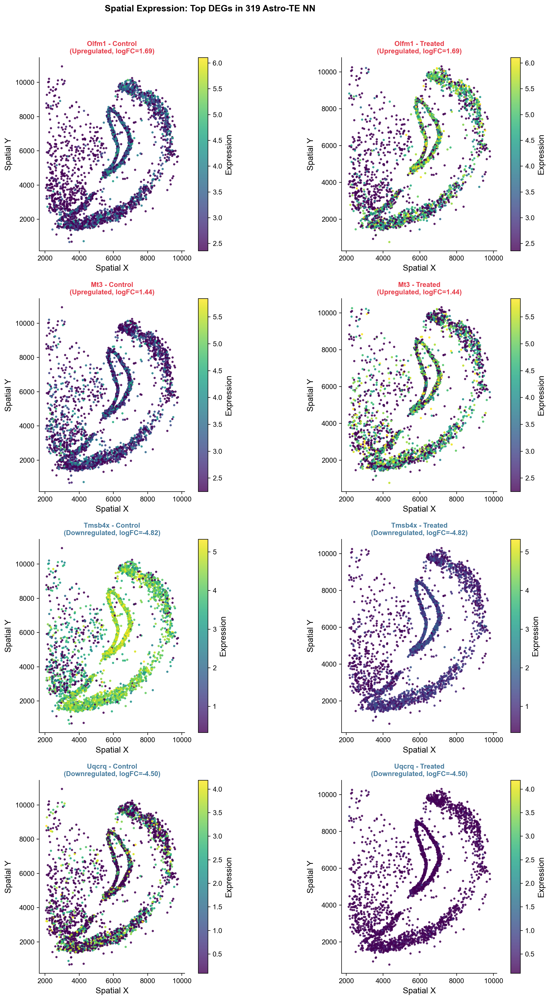

In [35]:
# Select top DEGs from the cell type with most DEGs
top_ct = deg_summary_df.iloc[0]['cell_type']
top_df = all_deg_results[top_ct]

top_up_genes = top_df[top_df['regulation'] == 'Upregulated'].nlargest(2, 'logfoldchanges')['names'].tolist()
top_down_genes = top_df[top_df['regulation'] == 'Downregulated'].nsmallest(2, 'logfoldchanges')['names'].tolist()
spatial_genes = (top_up_genes + top_down_genes)[:4]

if len(spatial_genes) > 0:
    fig, axes = plt.subplots(len(spatial_genes), 2, figsize=(14, 5 * len(spatial_genes)))
    if len(spatial_genes) == 1:
        axes = axes.reshape(1, -1)

    for row_idx, gene in enumerate(spatial_genes):
        if gene not in adata_combined.raw.var_names:
            continue

        gene_idx = adata_combined.raw.var_names.get_loc(gene)
        expr = adata_combined.raw.X[:, gene_idx]
        if issparse(expr):
            expr = expr.toarray().flatten()

        logfc = top_df[top_df['names'] == gene]['logfoldchanges'].values[0]
        reg = top_df[top_df['names'] == gene]['regulation'].values[0]
        color = COLORS['upregulated'] if reg == 'Upregulated' else COLORS['downregulated']

        # Shared colorbar range
        vmin, vmax = np.percentile(expr[expr > 0], [2, 98]) if (expr > 0).sum() > 10 else (0, 1)

        for col_idx, cond in enumerate(['Control', 'Treated']):
            mask = adata_combined.obs['condition'] == cond
            coords = adata_combined.obsm['spatial'][mask]

            sc_plot = axes[row_idx, col_idx].scatter(
                coords[:, 0], coords[:, 1],
                c=expr[mask], cmap='viridis', s=5, alpha=0.8,
                vmin=vmin, vmax=vmax)

            axes[row_idx, col_idx].set_title(
                f'{gene} - {cond}\n({reg}, logFC={logfc:.2f})',
                fontweight='bold', fontsize=10, color=color)
            axes[row_idx, col_idx].set_aspect('equal')
            axes[row_idx, col_idx].set_xlabel('Spatial X')
            axes[row_idx, col_idx].set_ylabel('Spatial Y')
            plt.colorbar(sc_plot, ax=axes[row_idx, col_idx],
                        label='Expression', fraction=0.046, pad=0.04)

    fig.suptitle(f'Spatial Expression: Top DEGs in {top_ct}', fontweight='bold', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

## 9. Summary and Export

In [36]:
# ============================================================
# ANALYSIS SUMMARY
# ============================================================
print("=" * 80)
print("ANALYSIS SUMMARY")
print("=" * 80)

print(f"\n1. DATA")
print(f"   Healthy control: {adata_control.n_obs:,} spots")
print(f"   Cancerous (mock): {adata_treated.n_obs:,} spots")
print(f"   Combined (after QC): {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")

print(f"\n2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)")
print(f"   Distinct cell types: {adata_combined.obs['majority_voting'].nunique()}")
print(f"   Categories plotted: {len(cell_types_unique)}")

print(f"\n3. DIFFERENTIAL EXPRESSION (per cell type, Cancerous vs Control)")
for _, row in deg_summary_df.iterrows():
    print(f"   {row['cell_type']}: {row['n_up']} up, {row['n_down']} down")

print(f"\n4. GSEA (per cell type)")
if all_gsea_results:
    for ct, df in all_gsea_results.items():
        n_sig = (df['FDR q-val'] < 0.25).sum()
        print(f"   {ct}: {n_sig} significant pathways")
else:
    print("   No GSEA results (gene set library not available)")

print(f"\n5. PROPORTION CHANGES")
sig_props = fisher_df[fisher_df['p_adj'] < 0.05]
print(f"   Significantly changed cell types: {len(sig_props)}")

print("\n" + "=" * 80)

ANALYSIS SUMMARY

1. DATA
   Healthy control: 4,000 spots
   Cancerous (mock): 3,400 spots
   Combined (after QC): 7,144 spots, 15,413 genes

2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)
   Distinct cell types: 4
   Categories plotted: 4

3. DIFFERENTIAL EXPRESSION (per cell type, Cancerous vs Control)
   319 Astro-TE NN: 24 up, 66 down
   332 SMC NN: 17 up, 47 down
   318 Astro-NT NN: 5 up, 13 down
   037 DG Glut: 1 up, 6 down

4. GSEA (per cell type)
   319 Astro-TE NN: 0 significant pathways
   332 SMC NN: 2 significant pathways
   318 Astro-NT NN: 1 significant pathways
   037 DG Glut: 3 significant pathways

5. PROPORTION CHANGES
   Significantly changed cell types: 0



In [37]:
# --- Export all results ---
results_dir = 'integration_results/'
os.makedirs(results_dir, exist_ok=True)

# Save the full integrated AnnData object
output_path = 'adult_mouse_brain_ST4k_integrated.h5ad'
adata_combined.write(output_path)
print(f"Integrated data: {output_path}")

# Save per-cell-type DEG tables
all_degs = pd.concat(all_deg_results.values(), ignore_index=True)
all_degs.to_csv(f"{results_dir}deg_per_cell_type.csv", index=False)
print(f"DEG results: {results_dir}deg_per_cell_type.csv")

# Save GSEA results (if available)
if all_gsea_results:
    all_gsea = pd.concat(all_gsea_results.values(), ignore_index=True)
    all_gsea.to_csv(f"{results_dir}gsea_per_cell_type.csv", index=False)
    print(f"GSEA results: {results_dir}gsea_per_cell_type.csv")

# Save proportion analysis
ct_props.to_csv(f"{results_dir}cell_type_proportions.csv")
fisher_df.to_csv(f"{results_dir}proportion_tests.csv", index=False)
print(f"Proportions: {results_dir}cell_type_proportions.csv")

print("\nAll results exported.")

Integrated data: adult_mouse_brain_ST4k_integrated.h5ad
DEG results: integration_results/deg_per_cell_type.csv
GSEA results: integration_results/gsea_per_cell_type.csv
Proportions: integration_results/cell_type_proportions.csv

All results exported.
